Domestic vs Wild Cat Classification

In [ ]:
!unzip animals_dataset.zip

Archive:  animals_dataset.zip
   creating: animals_dataset/
   creating: animals_dataset/cats/
  inflating: animals_dataset/.DS_Store  
  inflating: __MACOSX/animals_dataset/._.DS_Store  
   creating: animals_dataset/big_cats/
  inflating: animals_dataset/cats/flickr_cat_000619.jpg  
  inflating: __MACOSX/animals_dataset/cats/._flickr_cat_000619.jpg  
  inflating: animals_dataset/cats/flickr_cat_000143.jpg  
  inflating: __MACOSX/animals_dataset/cats/._flickr_cat_000143.jpg  
  inflating: animals_dataset/cats/flickr_cat_000625.jpg  
  inflating: __MACOSX/animals_dataset/cats/._flickr_cat_000625.jpg  
  inflating: animals_dataset/cats/flickr_cat_000631.jpg  
  inflating: __MACOSX/animals_dataset/cats/._flickr_cat_000631.jpg  
  inflating: animals_dataset/cats/flickr_cat_000157.jpg  
  inflating: __MACOSX/animals_dataset/cats/._flickr_cat_000157.jpg  
  inflating: animals_dataset/cats/flickr_cat_000802.jpg  
  inflating: __MACOSX/animals_dataset/cats/._flickr_cat_000802.jpg  
  inflating

Splitting the dataset, creating train and test folders

In [ ]:
import os
import numpy as np
import shutil

rootdir= '/content/animals_dataset' #path of the original folder

classes = ['cats', 'big_cats']

for i in classes:
  os.makedirs(rootdir +'/train/' + i)
  os.makedirs(rootdir +'/test/' + i)
  source = rootdir + '/' + i
  allFileNames = os.listdir(source)
  np.random.shuffle(allFileNames)
  test_ratio = 0.2
  train_FileNames, test_FileNames = np.split(np.array(allFileNames),[int(len(allFileNames)* (1 - test_ratio))])
  train_FileNames = [source+'/'+ name for name in train_FileNames.tolist()]
  test_FileNames = [source+'/' + name for name in test_FileNames.tolist()]
  
  for name in train_FileNames:
    shutil.copy(name, rootdir +'/train/' + i)
  for name in test_FileNames:
    shutil.copy(name, rootdir +'/test/' + i)

In [ ]:
# define and move to dataset directory
datasetdir = '/content/animals_dataset/train'
import os
os.chdir(datasetdir)

# import the needed packages
import matplotlib.pyplot as plt
import matplotlib.image as img
from tensorflow import keras
# shortcut to the ImageDataGenerator class
ImageDataGenerator = keras.preprocessing.image.ImageDataGenerator

Investigating dataset

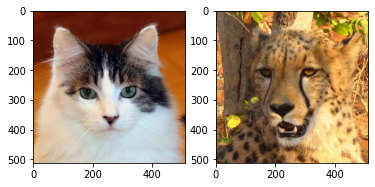

In [ ]:
plt.subplot(1,2,1)
plt.imshow(img.imread('cats/flickr_cat_000008.jpg'))
plt.subplot(1,2,2)
plt.imshow(img.imread('big_cats/flickr_wild_000710.jpg'))

Loading the datset with keras

In [ ]:
gen = ImageDataGenerator()

Data Preprocessing, here downsampling the images with the help of target_image

In [ ]:
iterator = gen.flow_from_directory(
    os.getcwd(), 
    target_size=(256,256), 
    classes=('cats','big_cats')
)
print(os.getcwd())

Found 1280 images belonging to 2 classes.
/content/animals_dataset/train


In [ ]:
# we can guess that the iterator has a next function, 
# because all python iterators have one. 
batch = iterator.next()
len(batch)

2

In [ ]:
print(type(batch[0]))
print(type(batch[1]))

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


Info about dimensions, colour of dataset images

In [ ]:
print(batch[0].shape)
print(batch[0].dtype)
print(batch[0].max())
print(batch[1].shape)
print(batch[1].dtype)

(32, 256, 256, 3)
float32
255.0
(32, 2)
float32


Using label info to print image

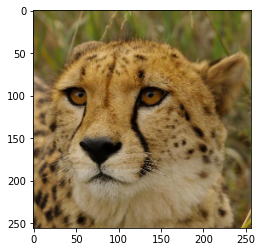

In [ ]:
import numpy as np
# we need to cast the image array to integers 
# before plotting as imshow either takes arrays of integers, 
# or arrays of floats normalized to 1. 
plt.imshow(batch[0][0].astype(np.int))

corresponding label

In [ ]:
batch[1][0]

array([0., 1.], dtype=float32)

label validation

In [ ]:
def plot_images(batch):
    imgs = batch[0]
    labels = batch[1]
    ncols, nrows = 4,8
    fig = plt.figure( figsize=(ncols*3, nrows*3), dpi=90)
    for i, (img,label) in enumerate(zip(imgs,labels)):
      plt.subplot(nrows, ncols, i+1)
      plt.imshow(img.astype(np.int))
      assert(label[0]+label[1]==1.)
      categ = 'cat' if label[0]>0.5 else 'big_cat'
      plt.title( '{} {}'.format(str(label), categ))
      plt.axis('off')

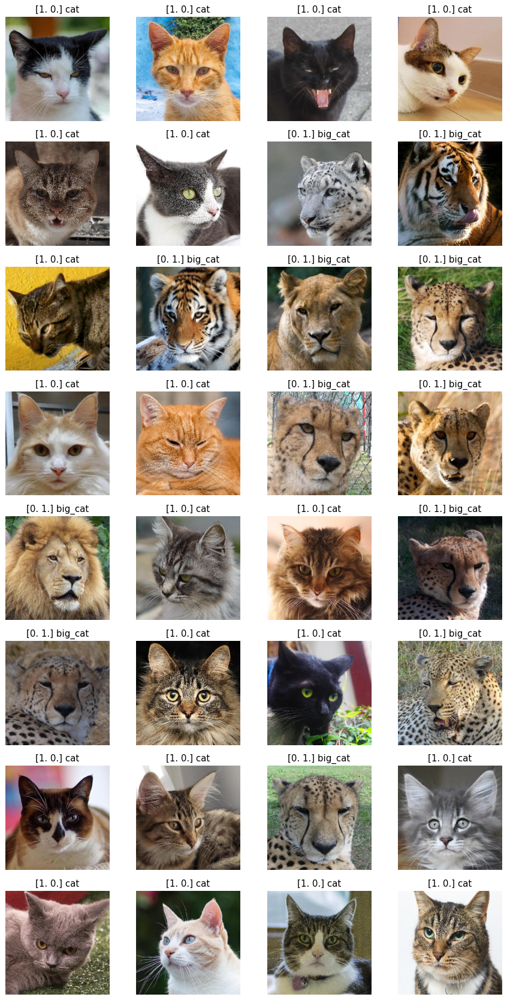

In [ ]:
plot_images(iterator.next())

Split the training and validation dataset with ImageDataGenerator

In [ ]:
imgdatagen = ImageDataGenerator(
    rescale = 1/255., 
    validation_split = 0.2,
)

To store the global accuracy of optimizers used

In [ ]:
accuracy_list = []
optimizer_list = []

Adam

In [ ]:
batch_size = 32
height, width = (256,256)

train_dataset = imgdatagen.flow_from_directory(
    os.getcwd(),
    target_size = (height, width), 
    classes = ('cats','big_cats'),
    batch_size = batch_size,
    subset = 'training'
)

val_dataset = imgdatagen.flow_from_directory(
    os.getcwd(),
    target_size = (height, width), 
    classes = ('cats','big_cats'),
    batch_size = batch_size,
    subset = 'validation'
)

Found 1024 images belonging to 2 classes.
Found 256 images belonging to 2 classes.


Fully connected feed forward Neural Network

In [ ]:
model = keras.models.Sequential()

model.add(keras.layers.Dense(50, input_shape=(height,width,3), activation='relu'))
model.add(keras.layers.Dense(24, activation='relu'))
model.add( keras.layers.Flatten() )
model.add( keras.layers.Dropout(0.9) )

model.add( keras.layers.Dense(
    2, activation='softmax',
    )
)

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 256, 256, 50)      200       
_________________________________________________________________
dense_1 (Dense)              (None, 256, 256, 24)      1224      
_________________________________________________________________
flatten (Flatten)            (None, 1572864)           0         
_________________________________________________________________
dropout (Dropout)            (None, 1572864)           0         
_________________________________________________________________
dense_2 (Dense)              (None, 2)                 3145730   
Total params: 3,147,154
Trainable params: 3,147,154
Non-trainable params: 0
_________________________________________________________________


Optimizer

In [ ]:
model.compile(loss='binary_crossentropy',
              optimizer=keras.optimizers.Adam(lr=0.001),
              metrics=['acc'])

Model Training

In [ ]:
# Saves Keras model after each epoch
from keras.callbacks import ModelCheckpoint
checkpointer = ModelCheckpoint(filepath='/content/animals_dataset/img_model_adam.weights.best.hdf5', 
                               verbose=1, 
                               save_best_only=True)

In [ ]:
history = model.fit_generator(
    train_dataset, 
    validation_data = val_dataset,
    workers=10,
    epochs=20,
    callbacks= checkpointer
)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
32/32 [==============================] - 10s 210ms/step - loss: 2.1624 - acc: 0.6044 - val_loss: 0.5347 - val_acc: 0.7461

Epoch 00001: val_loss improved from inf to 0.53466, saving model to /content/animals_dataset/img_model_adam.weights.best.hdf5
Epoch 2/20
32/32 [==============================] - 8s 205ms/step - loss: 0.3340 - acc: 0.8662 - val_loss: 0.4289 - val_acc: 0.8047

Epoch 00002: val_loss improved from 0.53466 to 0.42889, saving model to /content/animals_dataset/img_model_adam.weights.best.hdf5
Epoch 3/20
32/32 [==============================] - 8s 204ms/step - loss: 0.2186 - acc: 0.9092 - val_loss: 0.4346 - val_acc: 0.7969

Epoch 00003: val_loss did not improve from 0.42889
Epoch 4/20
32/32 [==============================] - 7s 200ms/step - loss: 0.1428 - acc: 0.9453 - val_loss: 0.5492 - val_acc: 0.7461

Epoch 00004: val_loss did not improve from 0.42889
Epoch 5/20
32/32 [==============================] - 8s 206ms/step - loss: 0.0810 - acc: 0.9812 - val_loss: 0.

Function to plot the loss and accuracy for both the training and validation datasets

In [ ]:
def plot_history(history, yrange):
    '''Plot loss and accuracy as a function of the epoch,
    for the training and validation datasets.
    '''
    acc = history.history['acc']
    val_acc = history.history['val_acc']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    # Get number of epochs
    epochs = range(len(acc))

    # Plot training and validation accuracy per epoch
    plt.plot(epochs, acc, label='training')
    plt.plot(epochs, val_acc,label='validation')
    plt.xlabel('epoch')
    plt.ylabel('accuracy')
    plt.title('Training and validation accuracy')
    plt.ylim(yrange)
    plt.legend()
    # Plot training and validation loss per epoch
    plt.figure()

    plt.plot(epochs, loss, label='training')
    plt.plot(epochs, val_loss, label='validation')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.title('Training and validation loss')
    plt.legend()
    
    plt.show()

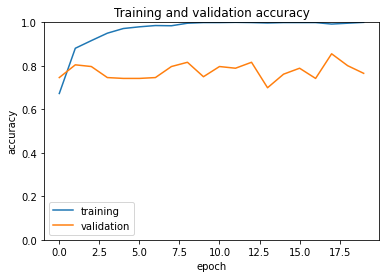

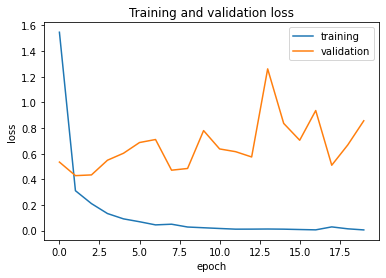

In [ ]:
plot_history(history, (0, 1.))

Testing our model

In [ ]:
test_generator = ImageDataGenerator(rescale=1/255.)

testgen = test_generator.flow_from_directory('/content/animals_dataset/test',
                                             target_size = (height, width), 
                                             batch_size = 1,
                                             class_mode= None,
                                             classes=classes, 
                                             shuffle=False,
                                             seed=42)


Found 320 images belonging to 2 classes.


In [ ]:
model.load_weights('/content/animals_dataset/img_model_adam.weights.best.hdf5')

predicted_classes = model.predict_classes(testgen)

class_indices = train_dataset.class_indices
print(class_indices)
class_indices = dict((v,k) for k,v in class_indices.items())
true_classes = testgen.classes

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


{'cats': 0, 'big_cats': 1}


display_results() will compare the images' true labels with the predicted labels.

plot_predictions() will allow us to visualize a sample of the test images, and the labels that the model generates.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_fscore_support, accuracy_score, confusion_matrix, roc_auc_score

def display_results(y_true, y_preds, class_labels):
    tn, fp, fn, tp = confusion_matrix(y_true, y_preds).ravel()
    spf1 = tp / (tp + fp)
    spf2 = tn / (tn+fp)
    results = pd.DataFrame(precision_recall_fscore_support(y_true, y_preds),
                          columns=class_labels).T
                          
    results.insert(4,'Specificity', [spf1, spf2],True)
    results.rename(columns={0: 'Precision', 1: 'Recall',
                            2: 'F-Score', 3: 'Support', 4: 'Specificity'}, inplace=True)
    
    results.sort_values(by='F-Score', ascending=False, inplace=True)                           
    global_acc = accuracy_score(y_true, y_preds)
    accuracy_list.append(global_acc)
    print("\u001b[1mOverall Categorical Accuracy: {:.2f}%".format(global_acc*100))

    print('\u001b[1mConfusion Matrix')
    print(confusion_matrix(y_true, y_preds))
    auc = roc_auc_score(y_true, y_preds)
    print('\u001b[1mAUC: %.3f' % auc)
    return results

def plot_predictions(y_true, y_preds, test_generator, class_indices):

    fig = plt.figure(figsize=(20, 10))
    for i, idx in enumerate(np.random.choice(test_generator.samples, size=20, replace=False)):
        ax = fig.add_subplot(4, 5, i + 1, xticks=[], yticks=[])
        ax.imshow(np.squeeze(test_generator[idx]))
        pred_idx = y_preds[idx]
        true_idx = y_true[idx]
                
        plt.tight_layout()
        ax.set_title("{}\n({})".format(class_indices[pred_idx], class_indices[true_idx]),
                     color=("green" if pred_idx == true_idx else "red"))

Plot to visualize a sample of test dataset images

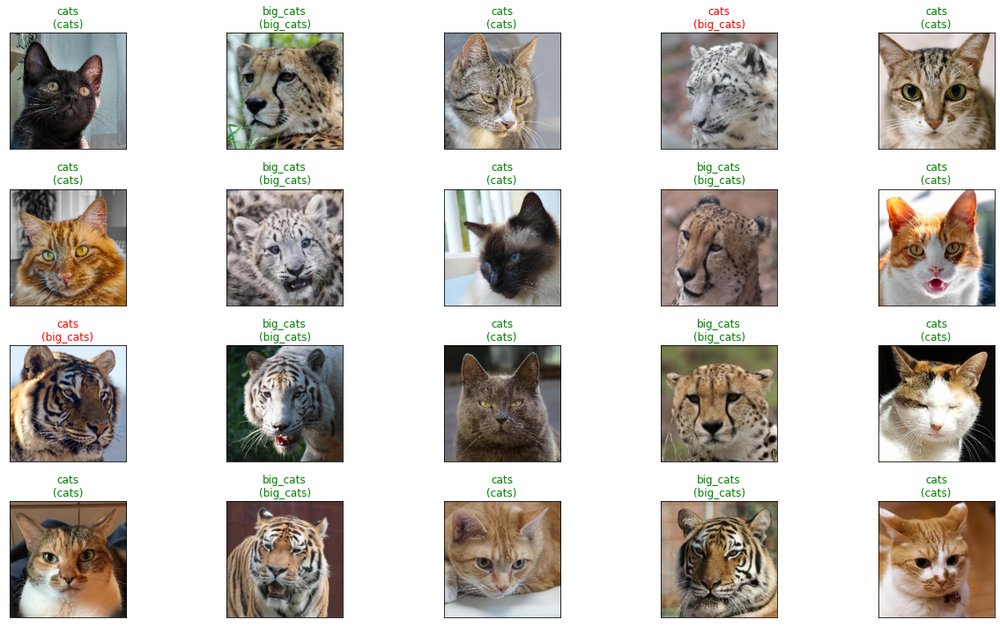

In [ ]:
plot_predictions(true_classes, predicted_classes, testgen, class_indices)

Accuracy, Precision, Recall/sensitivity, F-score, Support, Specificity, Confusion Matrix, AUC


In [ ]:
display_results(true_classes, predicted_classes, class_indices.values())

Overall Categorical Accuracy: 88.75%
Confusion Matrix
[[138  22]
 [ 14 146]]
AUC: 0.888


,Precision,Recall,F-Score,Support,Specificity
big_cats,0.869048,0.9125,0.890244,160.0,0.862500
cats,0.907895,0.8625,0.884615,160.0,0.869048


In [ ]:
optimizer_list.append('Adam')

Probability of test dataset belonging to {domestic , wild}

wild is labeled as 1

{'cats': 0, 'big_cats': 1}

In [ ]:
import numpy as np
np.set_printoptions(suppress=True)
prob_domestic_wild = model.predict_proba(testgen, batch_size= batch_size, verbose=1)
print(prob_domestic_wild)

  1/320 [..............................] - ETA: 37s

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


320/320 [==============================] - 3s 8ms/step
[[0.99817014 0.00182985]
 [0.8206997  0.17930035]
 [0.9030409  0.09695909]
 [0.99403363 0.00596641]
 [0.99889475 0.00110527]
 [0.99748105 0.00251892]
 [0.9992267  0.00077329]
 [0.0972548  0.9027452 ]
 [0.99542    0.00458007]
 [0.9755304  0.02446967]
 [0.99835324 0.0016468 ]
 [0.9998733  0.00012666]
 [0.9975763  0.00242372]
 [0.9170766  0.08292339]
 [0.99573874 0.0042613 ]
 [0.98736656 0.01263342]
 [0.9999994  0.0000006 ]
 [0.13057971 0.8694203 ]
 [0.99236286 0.0076371 ]
 [0.99999523 0.00000475]
 [0.59980905 0.40019098]
 [0.96490055 0.03509949]
 [0.9994885  0.00051155]
 [0.26617512 0.73382485]
 [0.21202229 0.7879777 ]
 [0.9737606  0.02623933]
 [0.999997   0.00000293]
 [0.26456967 0.7354303 ]
 [0.99994755 0.00005245]
 [0.9964395  0.00356048]
 [0.99968874 0.0003113 ]
 [0.9999087  0.00009135]
 [0.99995327 0.00004668]
 [0.89535826 0.10464175]
 [0.3693551  0.63064486]
 [0.96559393 0.03440602]
 [0.90373087 0.09626915]
 [0.9995596  0.00044

Probability of each test dataset image falling into positive class

wild is labeled as 1

{'cats': 0, 'big_cats': 1}

image path---------> prob(image belongs to wild dataset)

In [ ]:
print("%-70s %-10s" % ("Image_Path", "Probability( Wild)"))
for i in range(len(testgen.filepaths)):
  print("%-70s %-10.4f" % (testgen.filepaths[i], prob_domestic_wild[i][1]))

Image_Path                                                             Probability( Wild)
/content/animals_dataset/test/cats/flickr_cat_000019.jpg               0.0018    
/content/animals_dataset/test/cats/flickr_cat_000026.jpg               0.1793    
/content/animals_dataset/test/cats/flickr_cat_000029.jpg               0.0970    
/content/animals_dataset/test/cats/flickr_cat_000031.jpg               0.0060    
/content/animals_dataset/test/cats/flickr_cat_000033.jpg               0.0011    
/content/animals_dataset/test/cats/flickr_cat_000035.jpg               0.0025    
/content/animals_dataset/test/cats/flickr_cat_000038.jpg               0.0008    
/content/animals_dataset/test/cats/flickr_cat_000043.jpg               0.9027    
/content/animals_dataset/test/cats/flickr_cat_000064.jpg               0.0046    
/content/animals_dataset/test/cats/flickr_cat_000076.jpg               0.0245    
/content/animals_dataset/test/cats/flickr_cat_000079.jpg               0.0016    
/content

SGD batch size = 256

Found 1024 images belonging to 2 classes.
Found 256 images belonging to 2 classes.
Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_9 (Dense)              (None, 256, 256, 50)      200       
_________________________________________________________________
dense_10 (Dense)             (None, 256, 256, 24)      1224      
_________________________________________________________________
flatten_3 (Flatten)          (None, 1572864)           0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 1572864)           0         
_________________________________________________________________
dense_11 (Dense)             (None, 2)                 3145730   
Total params: 3,147,154
Trainable params: 3,147,154
Non-trainable params: 0
_________________________________________________________________


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
4/4 [==============================] - 12s 3s/step - loss: 3.9115 - acc: 0.4857 - val_loss: 0.6958 - val_acc: 0.5000

Epoch 00001: val_loss improved from inf to 0.69578, saving model to /content/animals_dataset/img_model_bsmax.weights.best.hdf5
Epoch 2/20
4/4 [==============================] - 11s 2s/step - loss: 0.6928 - acc: 0.5298 - val_loss: 0.6935 - val_acc: 0.5000

Epoch 00002: val_loss improved from 0.69578 to 0.69353, saving model to /content/animals_dataset/img_model_bsmax.weights.best.hdf5
Epoch 3/20
4/4 [==============================] - 11s 2s/step - loss: 0.7083 - acc: 0.4770 - val_loss: 0.6843 - val_acc: 0.5000

Epoch 00003: val_loss improved from 0.69353 to 0.68431, saving model to /content/animals_dataset/img_model_bsmax.weights.best.hdf5
Epoch 4/20
4/4 [==============================] - 11s 2s/step - loss: 0.6642 - acc: 0.6113 - val_loss: 0.6723 - val_acc: 0.6641

Epoch 00004: val_loss improved from 0.68431 to 0.67227, saving model to /content/animals_datase

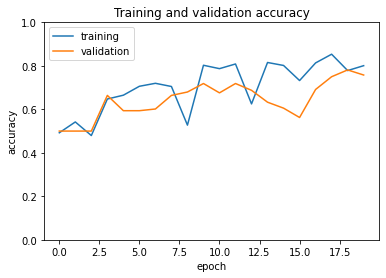

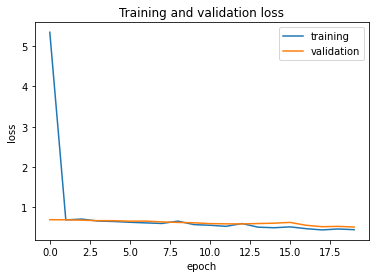

Found 320 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


{'cats': 0, 'big_cats': 1}
Overall Categorical Accuracy: 83.75%
Confusion Matrix
[[118  42]
 [ 10 150]]
AUC: 0.838


,Precision,Recall,F-Score,Support,Specificity
big_cats,0.781250,0.9375,0.852273,160.0,0.73750
cats,0.921875,0.7375,0.819444,160.0,0.78125


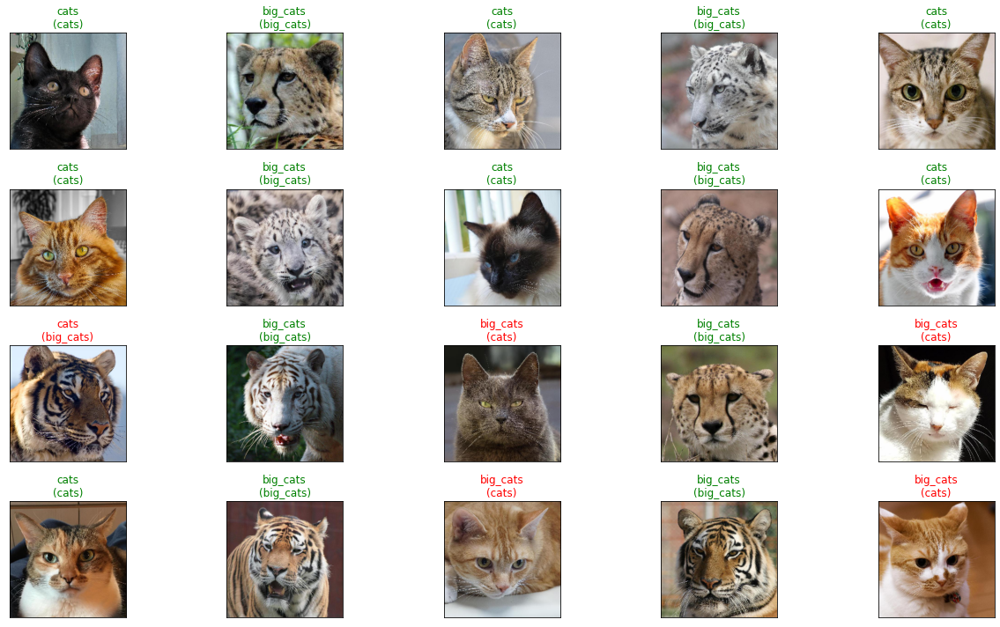

In [ ]:
height, width = (256,256)

train_dataset = imgdatagen.flow_from_directory(
    os.getcwd(),
    target_size = (height, width), 
    classes = ('cats','big_cats'),
    batch_size = 256,
    subset = 'training'
)

val_dataset = imgdatagen.flow_from_directory(
    os.getcwd(),
    target_size = (height, width), 
    classes = ('cats','big_cats'),
    batch_size = 256,
    subset = 'validation'
)

#Fully connected feed forward Neural Network
model = keras.models.Sequential()

model.add(keras.layers.Dense(50, input_shape=(height,width,3), activation='relu'))
model.add(keras.layers.Dense(24, activation='relu'))
model.add( keras.layers.Flatten() )
model.add( keras.layers.Dropout(0.9) )

model.add( keras.layers.Dense(
    2, activation='softmax',
    )
)

model.summary()

#Optimizer
model.compile(loss='binary_crossentropy',
              optimizer=keras.optimizers.SGD(lr = 0.01),
              metrics=['acc'])
#Model Training
# Saves Keras model after each epoch
from keras.callbacks import ModelCheckpoint
checkpointer = ModelCheckpoint(filepath='/content/animals_dataset/img_model_bsmax.weights.best.hdf5', 
                               verbose=1, 
                               save_best_only=True)
history = model.fit_generator(
    train_dataset, 
    validation_data = val_dataset,
    workers=10,
    epochs=20,
    callbacks= checkpointer
)

plot_history(history, (0, 1))

#Testing our model
test_generator = ImageDataGenerator(rescale=1/255.)

testgen = test_generator.flow_from_directory('/content/animals_dataset/test',
                                             target_size = (height, width), 
                                             batch_size = 1,
                                             class_mode= None,
                                             classes=classes, 
                                             shuffle=False,
                                             seed=42)
model.load_weights('/content/animals_dataset/img_model_bsmax.weights.best.hdf5')

predicted_classes = model.predict_classes(testgen)

class_indices = train_dataset.class_indices
print(class_indices)
class_indices = dict((v,k) for k,v in class_indices.items())
true_classes = testgen.classes

#Plot to visualize a sample of test dataset images        
plot_predictions(true_classes, predicted_classes, testgen, class_indices)

#Accuracy, Precision, Recall/sensitivity, F-score, Support, Specificity, Confusion Matrix, AUC
display_results(true_classes, predicted_classes, class_indices.values())


In [ ]:
optimizer_list.append('SGD(BS=256)')

In [ ]:
# Probability of test dataset belonging to {domestic , wild}

# wild is labeled as 1

# {'cats': 0, 'big_cats': 1}
import numpy as np
np.set_printoptions(suppress=True)
prob_domestic_wild = model.predict_proba(testgen, batch_size= 1, verbose=1)
print(prob_domestic_wild)

# Probability of each test dataset image falling into positive class

# wild is labeled as 1

# {'cats': 0, 'big_cats': 1}

# image path---------> prob(image belongs to wild dataset)

print("%-70s %-10s" % ("Image_Path", "Probability( Wild)"))
for i in range(len(testgen.filepaths)):
  print("%-70s %-10.4f" % (testgen.filepaths[i], prob_domestic_wild[i][1]))


 17/320 [>.............................] - ETA: 1s

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


320/320 [==============================] - 2s 7ms/step
[[0.88548017 0.11451983]
 [0.8202977  0.17970233]
 [0.8468842  0.15311576]
 [0.9456637  0.05433631]
 [0.8366748  0.16332518]
 [0.89083195 0.10916808]
 [0.9692331  0.03076683]
 [0.55394495 0.44605502]
 [0.964896   0.03510398]
 [0.35000363 0.6499964 ]
 [0.35395512 0.6460449 ]
 [0.69231665 0.3076833 ]
 [0.954169   0.04583102]
 [0.54330665 0.45669338]
 [0.86520946 0.13479057]
 [0.73358107 0.266419  ]
 [0.97600013 0.02399981]
 [0.08203497 0.91796505]
 [0.9828448  0.01715513]
 [0.9937483  0.00625171]
 [0.49002764 0.5099724 ]
 [0.5728061  0.42719385]
 [0.92229897 0.07770107]
 [0.09851202 0.901488  ]
 [0.15631834 0.8436817 ]
 [0.78612345 0.21387655]
 [0.9844401  0.01555993]
 [0.54618275 0.45381728]
 [0.96612364 0.03387635]
 [0.9681616  0.03183837]
 [0.85424197 0.14575805]
 [0.8193089  0.1806911 ]
 [0.98951066 0.01048942]
 [0.3119989  0.6880011 ]
 [0.30465856 0.6953414 ]
 [0.46366832 0.53633165]
 [0.2894094  0.7105906 ]
 [0.9552493  0.04475

SGD batch size = 16 momentum=0.9

Found 1024 images belonging to 2 classes.
Found 256 images belonging to 2 classes.
Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_12 (Dense)             (None, 256, 256, 50)      200       
_________________________________________________________________
dense_13 (Dense)             (None, 256, 256, 24)      1224      
_________________________________________________________________
flatten_4 (Flatten)          (None, 1572864)           0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 1572864)           0         
_________________________________________________________________
dense_14 (Dense)             (None, 2)                 3145730   
Total params: 3,147,154
Trainable params: 3,147,154
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


64/64 [==============================] - 8s 104ms/step - loss: 0.9584 - acc: 0.5826 - val_loss: 0.6893 - val_acc: 0.6719

Epoch 00001: val_loss improved from inf to 0.68930, saving model to /content/animals_dataset/img_model_bs16_1.weights.best.hdf5
Epoch 2/20
64/64 [==============================] - 7s 102ms/step - loss: 0.6930 - acc: 0.5417 - val_loss: 0.6931 - val_acc: 0.5078

Epoch 00002: val_loss did not improve from 0.68930
Epoch 3/20
64/64 [==============================] - 7s 102ms/step - loss: 0.6816 - acc: 0.5388 - val_loss: 0.6932 - val_acc: 0.5000

Epoch 00003: val_loss did not improve from 0.68930
Epoch 4/20
64/64 [==============================] - 7s 98ms/step - loss: 0.6934 - acc: 0.4897 - val_loss: 0.6931 - val_acc: 0.5000

Epoch 00004: val_loss did not improve from 0.68930
Epoch 5/20
64/64 [==============================] - 7s 99ms/step - loss: 0.6933 - acc: 0.5047 - val_loss: 0.6932 - val_acc: 0.5000

Epoch 00005: val_loss did not improve from 0.68930
Epoch 6/20
64/64

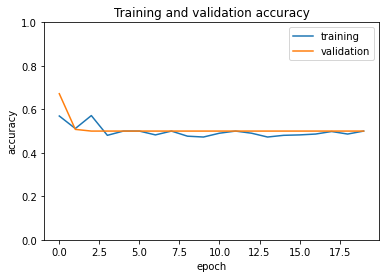

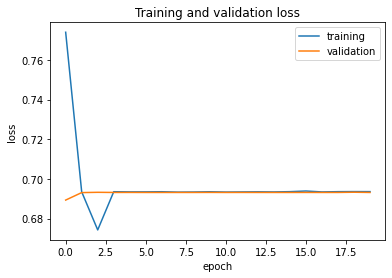

Found 320 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


{'cats': 0, 'big_cats': 1}
Overall Categorical Accuracy: 60.94%
Confusion Matrix
[[125  35]
 [ 90  70]]
AUC: 0.609


,Precision,Recall,F-Score,Support,Specificity
cats,0.581395,0.78125,0.666667,160.0,0.666667
big_cats,0.666667,0.43750,0.528302,160.0,0.781250


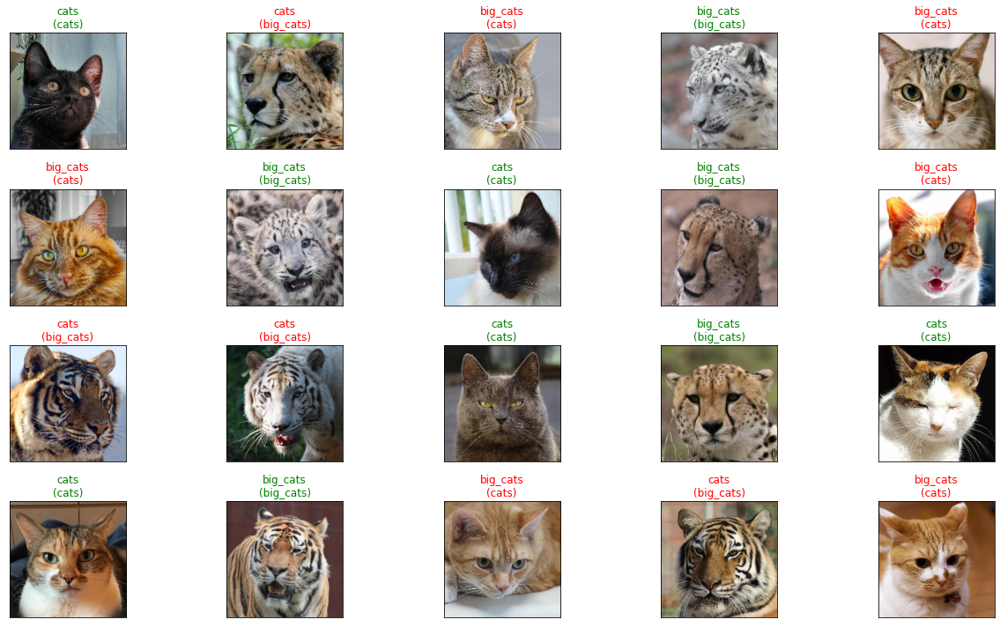

In [ ]:
batch_size = 16
height, width = (256,256)

train_dataset = imgdatagen.flow_from_directory(
    os.getcwd(),
    target_size = (height, width), 
    classes = ('cats','big_cats'),
    batch_size = batch_size,
    subset = 'training'
)

val_dataset = imgdatagen.flow_from_directory(
    os.getcwd(),
    target_size = (height, width), 
    classes = ('cats','big_cats'),
    batch_size = batch_size,
    subset = 'validation'
)

#Fully connected feed forward Neural Network
model = keras.models.Sequential()

model.add(keras.layers.Dense(50, input_shape=(height,width,3), activation='relu'))
model.add(keras.layers.Dense(24, activation='relu'))
model.add( keras.layers.Flatten() )
model.add( keras.layers.Dropout(0.9) )

model.add( keras.layers.Dense(
    2, activation='softmax',
    )
)

model.summary()

#Optimizer
model.compile(loss='binary_crossentropy',
              optimizer=keras.optimizers.SGD(lr = 0.01, momentum=0.9),
              metrics=['acc'])
#Model Training
# Saves Keras model after each epoch
from keras.callbacks import ModelCheckpoint
checkpointer = ModelCheckpoint(filepath='/content/animals_dataset/img_model_bs16_1.weights.best.hdf5', 
                               verbose=1, 
                               save_best_only=True)
history = model.fit_generator(
    train_dataset, 
    validation_data = val_dataset,
    workers=10,
    epochs=20,
    callbacks= checkpointer
)

plot_history(history, (0, 1))

#Testing our model
test_generator = ImageDataGenerator(rescale=1/255.)

testgen = test_generator.flow_from_directory('/content/animals_dataset/test',
                                             target_size = (height, width), 
                                             batch_size = 1,
                                             class_mode= None,
                                             classes=classes, 
                                             shuffle=False,
                                             seed=42)
model.load_weights('/content/animals_dataset/img_model_bs16_1.weights.best.hdf5')

predicted_classes = model.predict_classes(testgen)

class_indices = train_dataset.class_indices
print(class_indices)
class_indices = dict((v,k) for k,v in class_indices.items())
true_classes = testgen.classes

#Plot to visualize a sample of test dataset images        
plot_predictions(true_classes, predicted_classes, testgen, class_indices)

#Accuracy, Precision, Recall/sensitivity, F-score, Support, Specificity, Confusion Matrix, AUC
display_results(true_classes, predicted_classes, class_indices.values())


In [ ]:
optimizer_list.append('SGD(BS=16,m=0.9)')

In [ ]:
# Probability of test dataset belonging to {domestic , wild}

# wild is labeled as 1

# {'cats': 0, 'big_cats': 1}
import numpy as np
np.set_printoptions(suppress=True)
prob_domestic_wild = model.predict_proba(testgen, batch_size= batch_size, verbose=1)
print(prob_domestic_wild)

# Probability of each test dataset image falling into positive class

# wild is labeled as 1

# {'cats': 0, 'big_cats': 1}

# image path---------> prob(image belongs to wild dataset)

print("%-70s %-10s" % ("Image_Path", "Probability( Wild)"))
for i in range(len(testgen.filepaths)):
  print("%-70s %-10.4f" % (testgen.filepaths[i], prob_domestic_wild[i][1]))
  

  3/320 [..............................] - ETA: 8s 

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


320/320 [==============================] - 3s 8ms/step
[[0.50928396 0.49071604]
 [0.50558245 0.49441758]
 [0.50722593 0.4927741 ]
 [0.50730467 0.49269533]
 [0.5081642  0.49183583]
 [0.5106133  0.48938665]
 [0.50990885 0.49009117]
 [0.49655706 0.50344294]
 [0.5055804  0.49441957]
 [0.5085015  0.49149853]
 [0.49888378 0.5011162 ]
 [0.5000686  0.49993142]
 [0.5111795  0.4888205 ]
 [0.50413096 0.49586904]
 [0.50585383 0.4941462 ]
 [0.4986262  0.50137377]
 [0.52113503 0.47886497]
 [0.50512046 0.4948795 ]
 [0.51292324 0.4870768 ]
 [0.506162   0.49383807]
 [0.5041747  0.49582526]
 [0.49974012 0.5002598 ]
 [0.51446646 0.4855336 ]
 [0.49677622 0.5032237 ]
 [0.50100625 0.49899372]
 [0.49806824 0.5019318 ]
 [0.5098026  0.49019742]
 [0.5000279  0.4999721 ]
 [0.5233562  0.4766438 ]
 [0.50096667 0.49903333]
 [0.5060844  0.49391562]
 [0.52962035 0.47037968]
 [0.513843   0.486157  ]
 [0.50071645 0.49928352]
 [0.49758974 0.50241023]
 [0.5080012  0.4919988 ]
 [0.50636727 0.4936327 ]
 [0.51425356 0.48574

SGD batch size = 16 momentum=0.5

Found 1024 images belonging to 2 classes.
Found 256 images belonging to 2 classes.
Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_15 (Dense)             (None, 256, 256, 50)      200       
_________________________________________________________________
dense_16 (Dense)             (None, 256, 256, 24)      1224      
_________________________________________________________________
flatten_5 (Flatten)          (None, 1572864)           0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 1572864)           0         
_________________________________________________________________
dense_17 (Dense)             (None, 2)                 3145730   
Total params: 3,147,154
Trainable params: 3,147,154
Non-trainable params: 0
_________________________________________________________________


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
64/64 [==============================] - 8s 105ms/step - loss: 1.0956 - acc: 0.5466 - val_loss: 0.5324 - val_acc: 0.7891

Epoch 00001: val_loss improved from inf to 0.53240, saving model to /content/animals_dataset/img_model_bs16_2.weights.best.hdf5
Epoch 2/20
64/64 [==============================] - 7s 100ms/step - loss: 0.5308 - acc: 0.7596 - val_loss: 0.4492 - val_acc: 0.8125

Epoch 00002: val_loss improved from 0.53240 to 0.44924, saving model to /content/animals_dataset/img_model_bs16_2.weights.best.hdf5
Epoch 3/20
64/64 [==============================] - 7s 100ms/step - loss: 0.4435 - acc: 0.7928 - val_loss: 0.5466 - val_acc: 0.6562

Epoch 00003: val_loss did not improve from 0.44924
Epoch 4/20
64/64 [==============================] - 7s 100ms/step - loss: 0.3881 - acc: 0.8250 - val_loss: 0.4620 - val_acc: 0.7305

Epoch 00004: val_loss did not improve from 0.44924
Epoch 5/20
64/64 [==============================] - 8s 103ms/step - loss: 0.3517 - acc: 0.8390 - val_loss:

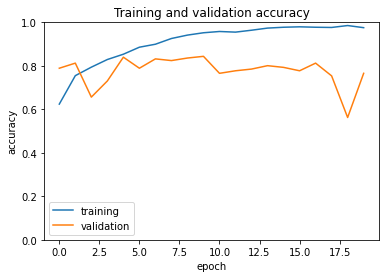

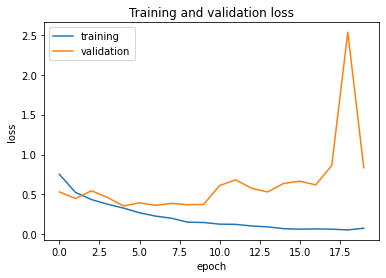

Found 320 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


{'cats': 0, 'big_cats': 1}
Overall Categorical Accuracy: 84.06%
Confusion Matrix
[[128  32]
 [ 19 141]]
AUC: 0.841


,Precision,Recall,F-Score,Support,Specificity
big_cats,0.815029,0.88125,0.846847,160.0,0.800000
cats,0.870748,0.80000,0.833876,160.0,0.815029


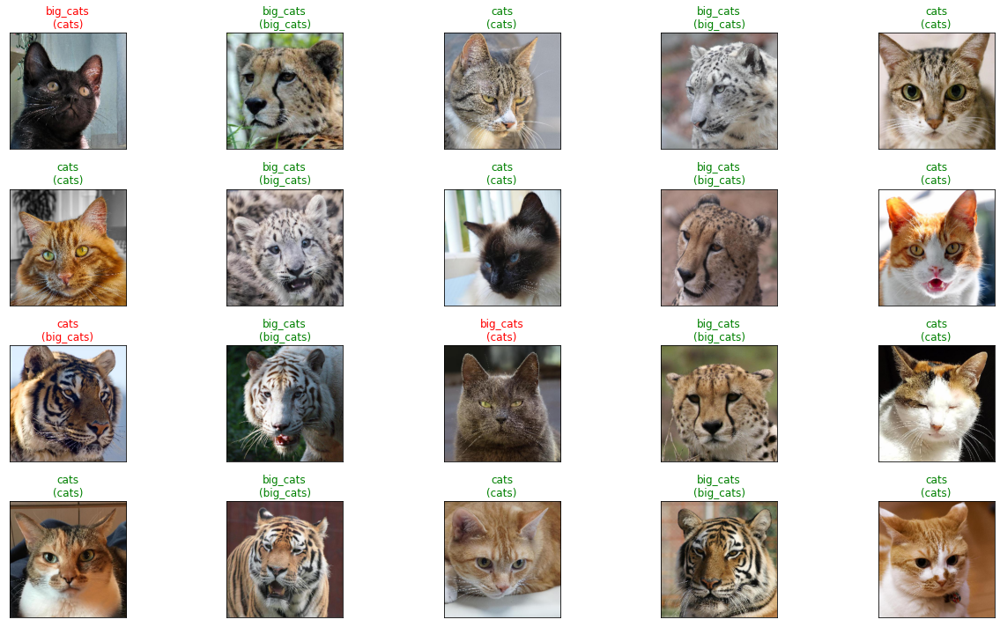

In [ ]:
batch_size = 16
height, width = (256,256)

train_dataset = imgdatagen.flow_from_directory(
    os.getcwd(),
    target_size = (height, width), 
    classes = ('cats','big_cats'),
    batch_size = batch_size,
    subset = 'training'
)

val_dataset = imgdatagen.flow_from_directory(
    os.getcwd(),
    target_size = (height, width), 
    classes = ('cats','big_cats'),
    batch_size = batch_size,
    subset = 'validation'
)

#Fully connected feed forward Neural Network
model = keras.models.Sequential()

model.add(keras.layers.Dense(50, input_shape=(height,width,3), activation='relu'))
model.add(keras.layers.Dense(24, activation='relu'))
model.add( keras.layers.Flatten() )
model.add( keras.layers.Dropout(0.9) )

model.add( keras.layers.Dense(
    2, activation='softmax',
    )
)

model.summary()

#Optimizer
model.compile(loss='binary_crossentropy',
              optimizer=keras.optimizers.SGD(lr = 0.01, momentum= 0.5),
              metrics=['acc'])
#Model Training
# Saves Keras model after each epoch
from keras.callbacks import ModelCheckpoint
checkpointer = ModelCheckpoint(filepath='/content/animals_dataset/img_model_bs16_2.weights.best.hdf5', 
                               verbose=1, 
                               save_best_only=True)
history = model.fit_generator(
    train_dataset, 
    validation_data = val_dataset,
    workers=10,
    epochs=20,
    callbacks= checkpointer
)

plot_history(history, (0, 1))

#Testing our model
test_generator = ImageDataGenerator(rescale=1/255.)

testgen = test_generator.flow_from_directory('/content/animals_dataset/test',
                                             target_size = (height, width), 
                                             batch_size = 1,
                                             class_mode= None,
                                             classes=classes, 
                                             shuffle=False,
                                             seed=42)
model.load_weights('/content/animals_dataset/img_model_bs16_2.weights.best.hdf5')

predicted_classes = model.predict_classes(testgen)

class_indices = train_dataset.class_indices
print(class_indices)
class_indices = dict((v,k) for k,v in class_indices.items())
true_classes = testgen.classes

#Plot to visualize a sample of test dataset images        
plot_predictions(true_classes, predicted_classes, testgen, class_indices)

#Accuracy, Precision, Recall/sensitivity, F-score, Support, Specificity, Confusion Matrix, AUC
display_results(true_classes, predicted_classes, class_indices.values())


In [ ]:
optimizer_list.append('SGD(BS=16,m=0.5)')

In [ ]:
# Probability of test dataset belonging to {domestic , wild}

# wild is labeled as 1

# {'cats': 0, 'big_cats': 1}
import numpy as np
np.set_printoptions(suppress=True)
prob_domestic_wild = model.predict_proba(testgen, batch_size= batch_size, verbose=1)
print(prob_domestic_wild)

# Probability of each test dataset image falling into positive class

# wild is labeled as 1

# {'cats': 0, 'big_cats': 1}

# image path---------> prob(image belongs to wild dataset)

print("%-70s %-10s" % ("Image_Path", "Probability( Wild)"))
for i in range(len(testgen.filepaths)):
  print("%-70s %-10.4f" % (testgen.filepaths[i], prob_domestic_wild[i][1]))
  

  1/320 [..............................] - ETA: 33s

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


320/320 [==============================] - 3s 8ms/step
[[0.9997304  0.00026961]
 [0.99924445 0.00075557]
 [0.8999228  0.10007723]
 [0.99946517 0.00053479]
 [0.9193486  0.08065146]
 [0.99964106 0.00035893]
 [0.9994948  0.00050521]
 [0.14350133 0.85649866]
 [0.9986492  0.00135084]
 [0.1938963  0.8061037 ]
 [0.18800691 0.81199306]
 [0.9999709  0.00002911]
 [0.9998896  0.0001104 ]
 [0.9896069  0.01039302]
 [0.37590167 0.6240983 ]
 [0.99792093 0.00207906]
 [0.9999753  0.00002469]
 [0.95518595 0.04481405]
 [0.9999865  0.00001352]
 [0.99999976 0.00000018]
 [0.9577671  0.0422329 ]
 [0.9997745  0.00022554]
 [0.99675924 0.00324072]
 [0.06657237 0.9334277 ]
 [0.00355999 0.99644   ]
 [0.9776063  0.02239374]
 [0.9999815  0.0000185 ]
 [0.9999399  0.00006013]
 [0.9798504  0.02014963]
 [0.9990727  0.00092736]
 [0.99997663 0.00002335]
 [0.7691673  0.23083273]
 [0.9999938  0.00000618]
 [0.9508464  0.04915361]
 [0.01571211 0.98428786]
 [0.9996891  0.00031098]
 [0.3310281  0.6689719 ]
 [0.998089   0.00191

SGD batch size = 1

Found 1024 images belonging to 2 classes.
Found 256 images belonging to 2 classes.
Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18 (Dense)             (None, 256, 256, 50)      200       
_________________________________________________________________
dense_19 (Dense)             (None, 256, 256, 24)      1224      
_________________________________________________________________
flatten_6 (Flatten)          (None, 1572864)           0         
_________________________________________________________________
dropout_6 (Dropout)          (None, 1572864)           0         
_________________________________________________________________
dense_20 (Dense)             (None, 2)                 3145730   
Total params: 3,147,154
Trainable params: 3,147,154
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


1024/1024 [==============================] - 13s 12ms/step - loss: 0.8698 - acc: 0.4915 - val_loss: 0.6932 - val_acc: 0.5000

Epoch 00001: val_loss improved from inf to 0.69320, saving model to /content/animals_dataset/img_model_bs1.weights.best.hdf5
Epoch 2/20
1024/1024 [==============================] - 13s 12ms/step - loss: 0.6935 - acc: 0.5035 - val_loss: 0.6932 - val_acc: 0.5000

Epoch 00002: val_loss did not improve from 0.69320
Epoch 3/20
1024/1024 [==============================] - 12s 12ms/step - loss: 0.6930 - acc: 0.4930 - val_loss: 0.6932 - val_acc: 0.5000

Epoch 00003: val_loss improved from 0.69320 to 0.69318, saving model to /content/animals_dataset/img_model_bs1.weights.best.hdf5
Epoch 4/20
1024/1024 [==============================] - 13s 12ms/step - loss: 0.6943 - acc: 0.4554 - val_loss: 0.6932 - val_acc: 0.5078

Epoch 00004: val_loss improved from 0.69318 to 0.69315, saving model to /content/animals_dataset/img_model_bs1.weights.best.hdf5
Epoch 5/20
1024/1024 [=======

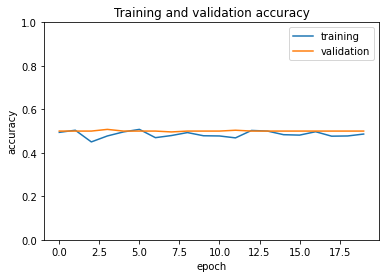

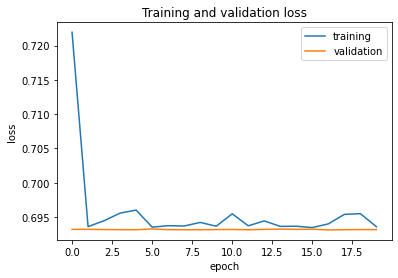

Found 320 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


{'cats': 0, 'big_cats': 1}
Overall Categorical Accuracy: 50.00%
Confusion Matrix
[[160   0]
 [160   0]]
AUC: 0.500


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in long_scalars
  import sys
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Precision,Recall,F-Score,Support,Specificity
cats,0.5,1.0,0.666667,160.0,NaN
big_cats,0.0,0.0,0.000000,160.0,1.0


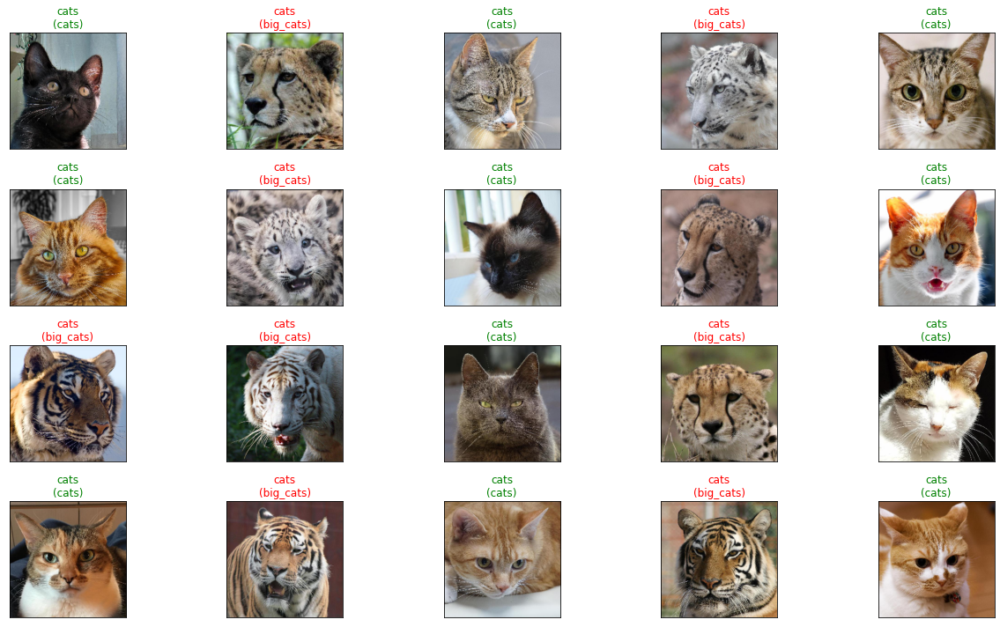

In [ ]:
batch_size = 1
height, width = (256,256)

train_dataset = imgdatagen.flow_from_directory(
    os.getcwd(),
    target_size = (height, width), 
    classes = ('cats','big_cats'),
    batch_size = batch_size,
    subset = 'training'
)

val_dataset = imgdatagen.flow_from_directory(
    os.getcwd(),
    target_size = (height, width), 
    classes = ('cats','big_cats'),
    batch_size = batch_size,
    subset = 'validation'
)

#Fully connected feed forward Neural Network
model = keras.models.Sequential()

model.add(keras.layers.Dense(50, input_shape=(height,width,3), activation='relu'))
model.add(keras.layers.Dense(24, activation='relu'))
model.add( keras.layers.Flatten() )
model.add( keras.layers.Dropout(0.9) )

model.add( keras.layers.Dense(
    2, activation='softmax',
    )
)

model.summary()

#Optimizer
model.compile(loss='binary_crossentropy',
              optimizer=keras.optimizers.SGD(lr = 0.01),
              metrics=['acc'])
#Model Training
# Saves Keras model after each epoch
from keras.callbacks import ModelCheckpoint
checkpointer = ModelCheckpoint(filepath='/content/animals_dataset/img_model_bs1.weights.best.hdf5',
                               verbose=1, 
                               save_best_only=True)
history = model.fit_generator(
    train_dataset, 
    validation_data = val_dataset,
    workers=10,
    epochs=20,
    callbacks= checkpointer
)

plot_history(history, (0, 1))

#Testing our model
test_generator = ImageDataGenerator(rescale=1/255.)

testgen = test_generator.flow_from_directory('/content/animals_dataset/test',
                                             target_size = (height, width), 
                                             batch_size = 1,
                                             class_mode= None,
                                             classes=classes, 
                                             shuffle=False,
                                             seed=42)
model.load_weights('/content/animals_dataset/img_model_bs1.weights.best.hdf5')

predicted_classes = model.predict_classes(testgen)

class_indices = train_dataset.class_indices
print(class_indices)
class_indices = dict((v,k) for k,v in class_indices.items())
true_classes = testgen.classes

#Plot to visualize a sample of test dataset images        
plot_predictions(true_classes, predicted_classes, testgen, class_indices)

#Accuracy, Precision, Recall/sensitivity, F-score, Support, Specificity, Confusion Matrix, AUC
display_results(true_classes, predicted_classes, class_indices.values())


In [ ]:
optimizer_list.append('SGD(BS=1)')

In [ ]:
# Probability of test dataset belonging to {domestic , wild}

# wild is labeled as 1

# {'cats': 0, 'big_cats': 1}
import numpy as np
np.set_printoptions(suppress=True)
prob_domestic_wild = model.predict_proba(testgen, batch_size= batch_size, verbose=1)
print(prob_domestic_wild)

# Probability of each test dataset image falling into positive class

# wild is labeled as 1

# {'cats': 0, 'big_cats': 1}

# image path---------> prob(image belongs to wild dataset)

print("%-70s %-10s" % ("Image_Path", "Probability( Wild)"))
for i in range(len(testgen.filepaths)):
  print("%-70s %-10.4f" % (testgen.filepaths[i], prob_domestic_wild[i][1]))
  

  4/320 [..............................] - ETA: 6s 

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


320/320 [==============================] - 3s 8ms/step
[[0.50965524 0.49034473]
 [0.5096485  0.4903515 ]
 [0.5111108  0.48888925]
 [0.5149939  0.4850061 ]
 [0.50965416 0.4903458 ]
 [0.5098354  0.49016455]
 [0.5097495  0.4902505 ]
 [0.50965524 0.49034473]
 [0.5096624  0.4903376 ]
 [0.5096554  0.49034455]
 [0.5098367  0.49016333]
 [0.50965524 0.49034473]
 [0.5097251  0.49027488]
 [0.5097298  0.4902702 ]
 [0.5103906  0.48960942]
 [0.50965524 0.49034473]
 [0.50966483 0.4903352 ]
 [0.5096554  0.49034455]
 [0.51099724 0.48900276]
 [0.50965524 0.49034473]
 [0.5097078  0.49029222]
 [0.50965524 0.49034473]
 [0.5097462  0.49025378]
 [0.50965345 0.49034655]
 [0.50965536 0.4903446 ]
 [0.509651   0.490349  ]
 [0.5096615  0.4903385 ]
 [0.5096777  0.49032226]
 [0.5096139  0.49038616]
 [0.509661   0.49033898]
 [0.50965524 0.49034473]
 [0.50966316 0.49033687]
 [0.5096534  0.4903466 ]
 [0.50967556 0.49032444]
 [0.5098584  0.49014157]
 [0.5096599  0.4903401 ]
 [0.50965846 0.49034157]
 [0.5096647  0.49033

RMSprop



Found 1024 images belonging to 2 classes.
Found 256 images belonging to 2 classes.
Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_21 (Dense)             (None, 256, 256, 50)      200       
_________________________________________________________________
dense_22 (Dense)             (None, 256, 256, 24)      1224      
_________________________________________________________________
flatten_7 (Flatten)          (None, 1572864)           0         
_________________________________________________________________
dropout_7 (Dropout)          (None, 1572864)           0         
_________________________________________________________________
dense_23 (Dense)             (None, 2)                 3145730   
Total params: 3,147,154
Trainable params: 3,147,154
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


32/32 [==============================] - 8s 213ms/step - loss: 10.8873 - acc: 0.5508 - val_loss: 0.6362 - val_acc: 0.7070

Epoch 00001: val_loss improved from inf to 0.63620, saving model to /content/animals_dataset/img_model_rmsprop.weights.best.hdf5
Epoch 2/20
32/32 [==============================] - 8s 205ms/step - loss: 0.4549 - acc: 0.8073 - val_loss: 0.7173 - val_acc: 0.6836

Epoch 00002: val_loss did not improve from 0.63620
Epoch 3/20
32/32 [==============================] - 8s 210ms/step - loss: 0.3268 - acc: 0.8555 - val_loss: 0.3749 - val_acc: 0.8516

Epoch 00003: val_loss improved from 0.63620 to 0.37485, saving model to /content/animals_dataset/img_model_rmsprop.weights.best.hdf5
Epoch 4/20
32/32 [==============================] - 8s 206ms/step - loss: 0.2130 - acc: 0.9229 - val_loss: 0.4913 - val_acc: 0.7930

Epoch 00004: val_loss did not improve from 0.37485
Epoch 5/20
32/32 [==============================] - 8s 204ms/step - loss: 0.1714 - acc: 0.9317 - val_loss: 0.7237 

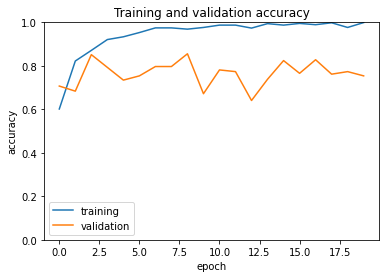

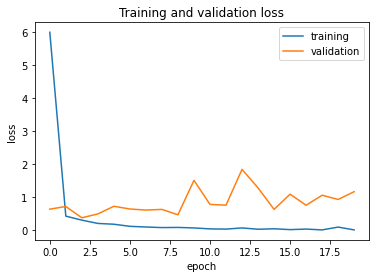

Found 320 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


{'cats': 0, 'big_cats': 1}
Overall Categorical Accuracy: 88.44%
Confusion Matrix
[[133  27]
 [ 10 150]]
AUC: 0.884


,Precision,Recall,F-Score,Support,Specificity
big_cats,0.847458,0.93750,0.890208,160.0,0.831250
cats,0.930070,0.83125,0.877888,160.0,0.847458


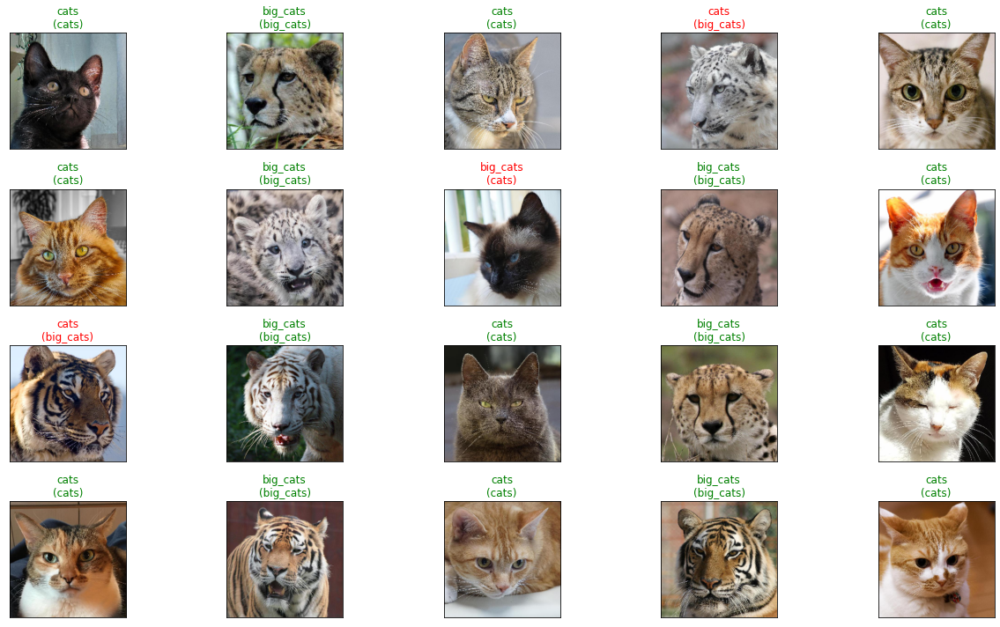

In [ ]:
batch_size = 32
height, width = (256,256)

train_dataset = imgdatagen.flow_from_directory(
    os.getcwd(),
    target_size = (height, width), 
    classes = ('cats','big_cats'),
    batch_size = batch_size,
    subset = 'training'
)

val_dataset = imgdatagen.flow_from_directory(
    os.getcwd(),
    target_size = (height, width), 
    classes = ('cats','big_cats'),
    batch_size = batch_size,
    subset = 'validation'
)

#Fully connected feed forward Neural Network
model = keras.models.Sequential()

model.add(keras.layers.Dense(50, input_shape=(height,width,3), activation='relu'))
model.add(keras.layers.Dense(24, activation='relu'))
model.add( keras.layers.Flatten() )
model.add( keras.layers.Dropout(0.9) )

model.add( keras.layers.Dense(
    2, activation='softmax',
    )
)

model.summary()

#Optimizer
model.compile(loss='binary_crossentropy',
              optimizer=keras.optimizers.RMSprop(lr = 0.001),
              metrics=['acc'])
#Model Training
# Saves Keras model after each epoch
from keras.callbacks import ModelCheckpoint
checkpointer = ModelCheckpoint(filepath='/content/animals_dataset/img_model_rmsprop.weights.best.hdf5', 
                               verbose=1, 
                               save_best_only=True)
history = model.fit_generator(
    train_dataset, 
    validation_data = val_dataset,
    workers=10,
    epochs=20,
    callbacks= checkpointer
)

plot_history(history, (0, 1))

#Testing our model
test_generator = ImageDataGenerator(rescale=1/255.)

testgen = test_generator.flow_from_directory('/content/animals_dataset/test',
                                             target_size = (height, width), 
                                             batch_size = 1,
                                             class_mode= None,
                                             classes=classes, 
                                             shuffle=False,
                                             seed=42)
model.load_weights('/content/animals_dataset/img_model_rmsprop.weights.best.hdf5')

predicted_classes = model.predict_classes(testgen)

class_indices = train_dataset.class_indices
print(class_indices)
class_indices = dict((v,k) for k,v in class_indices.items())
true_classes = testgen.classes

#Plot to visualize a sample of test dataset images        
plot_predictions(true_classes, predicted_classes, testgen, class_indices)

#Accuracy, Precision, Recall/sensitivity, F-score, Support, Specificity, Confusion Matrix, AUC
display_results(true_classes, predicted_classes, class_indices.values())


In [ ]:
optimizer_list.append('RMSprop')

In [ ]:
# Probability of test dataset belonging to {domestic , wild}

# wild is labeled as 1

# {'cats': 0, 'big_cats': 1}
import numpy as np
np.set_printoptions(suppress=True)
prob_domestic_wild = model.predict_proba(testgen, batch_size= batch_size, verbose=1)
print(prob_domestic_wild)

# Probability of each test dataset image falling into positive class

# wild is labeled as 1

# {'cats': 0, 'big_cats': 1}

# image path---------> prob(image belongs to wild dataset)

print("%-70s %-10s" % ("Image_Path", "Probability( Wild)"))
for i in range(len(testgen.filepaths)):
  print("%-70s %-10.4f" % (testgen.filepaths[i], prob_domestic_wild[i][1]))
  

  5/320 [..............................] - ETA: 4s 

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


320/320 [==============================] - 3s 8ms/step
[[0.9541604  0.04583959]
 [0.34881407 0.65118587]
 [0.99734014 0.0026598 ]
 [0.99996126 0.0000387 ]
 [0.9999018  0.00009818]
 [0.99791926 0.00208073]
 [0.99930286 0.00069718]
 [0.13929743 0.8607026 ]
 [0.996212   0.00378805]
 [0.87819624 0.12180374]
 [0.99788046 0.0021196 ]
 [0.98535675 0.01464321]
 [0.9724782  0.0275218 ]
 [0.7831348  0.21686517]
 [0.90774864 0.09225138]
 [0.9985851  0.00141486]
 [0.9999981  0.00000192]
 [0.5172482  0.4827518 ]
 [0.9925137  0.00748629]
 [0.9999596  0.00004044]
 [0.9474966  0.05250339]
 [0.89595884 0.10404118]
 [0.99295396 0.00704607]
 [0.0131794  0.98682064]
 [0.04965334 0.95034665]
 [0.7108935  0.28910652]
 [0.999972   0.00002806]
 [0.9637809  0.03621909]
 [0.9972785  0.00272155]
 [0.95826614 0.04173393]
 [0.99986064 0.00013929]
 [0.9423257  0.05767432]
 [0.99884677 0.00115315]
 [0.95382136 0.04617867]
 [0.35726523 0.64273477]
 [0.9999169  0.00008305]
 [0.9816347  0.0183653 ]
 [0.9982486  0.00175

Adagrad

Found 1024 images belonging to 2 classes.
Found 256 images belonging to 2 classes.
Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_33 (Dense)             (None, 256, 256, 50)      200       
_________________________________________________________________
dense_34 (Dense)             (None, 256, 256, 24)      1224      
_________________________________________________________________
flatten_11 (Flatten)         (None, 1572864)           0         
_________________________________________________________________
dropout_11 (Dropout)         (None, 1572864)           0         
_________________________________________________________________
dense_35 (Dense)             (None, 2)                 3145730   
Total params: 3,147,154
Trainable params: 3,147,154
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


32/32 [==============================] - 8s 213ms/step - loss: 3.7901 - acc: 0.6038 - val_loss: 0.8341 - val_acc: 0.5781

Epoch 00001: val_loss improved from inf to 0.83415, saving model to /content/animals_dataset/img_model_adagrad.weights.best.hdf5
Epoch 2/20
32/32 [==============================] - 8s 204ms/step - loss: 0.5088 - acc: 0.7538 - val_loss: 0.4720 - val_acc: 0.7773

Epoch 00002: val_loss improved from 0.83415 to 0.47197, saving model to /content/animals_dataset/img_model_adagrad.weights.best.hdf5
Epoch 3/20
32/32 [==============================] - 7s 202ms/step - loss: 0.4027 - acc: 0.8363 - val_loss: 0.6249 - val_acc: 0.6992

Epoch 00003: val_loss did not improve from 0.47197
Epoch 4/20
32/32 [==============================] - 8s 202ms/step - loss: 0.3669 - acc: 0.8620 - val_loss: 0.4258 - val_acc: 0.8008

Epoch 00004: val_loss improved from 0.47197 to 0.42577, saving model to /content/animals_dataset/img_model_adagrad.weights.best.hdf5
Epoch 5/20
32/32 [===============

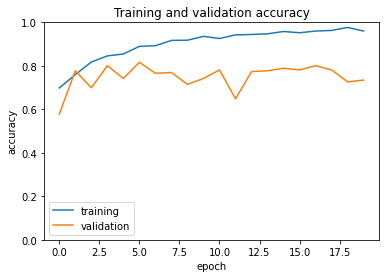

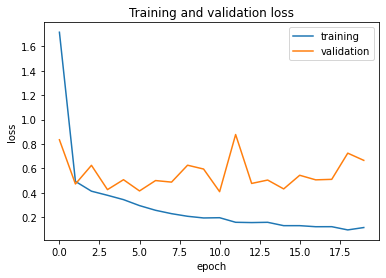

Found 320 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


{'cats': 0, 'big_cats': 1}
Overall Categorical Accuracy: 90.00%
Confusion Matrix
[[143  17]
 [ 15 145]]
AUC: 0.900


,Precision,Recall,F-Score,Support,Specificity
big_cats,0.895062,0.90625,0.900621,160.0,0.893750
cats,0.905063,0.89375,0.899371,160.0,0.895062


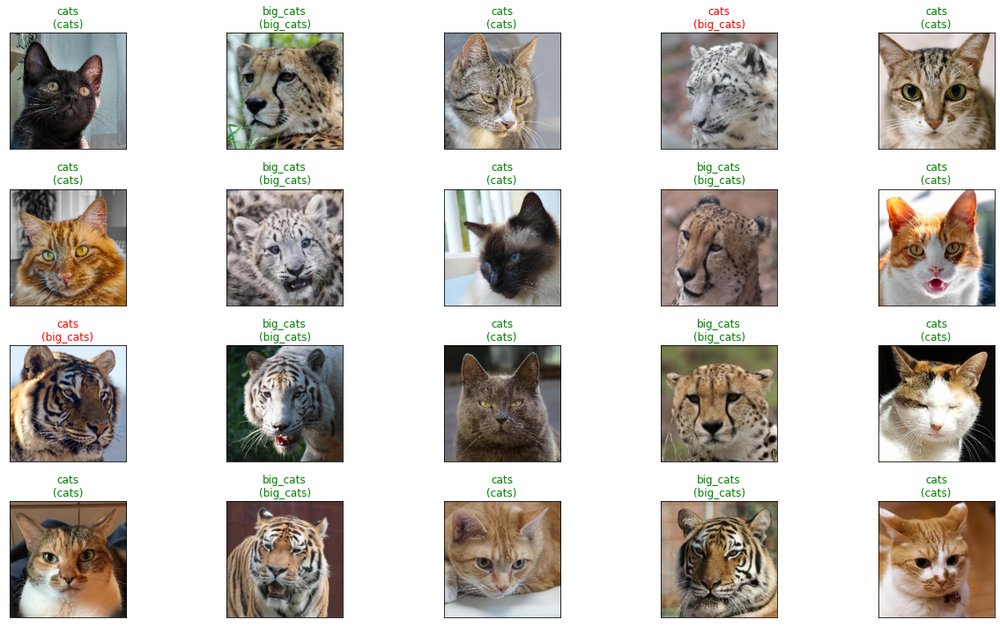

In [ ]:
batch_size = 32
height, width = (256,256)

train_dataset = imgdatagen.flow_from_directory(
    os.getcwd(),
    target_size = (height, width), 
    classes = ('cats','big_cats'),
    batch_size = batch_size,
    subset = 'training'
)

val_dataset = imgdatagen.flow_from_directory(
    os.getcwd(),
    target_size = (height, width), 
    classes = ('cats','big_cats'),
    batch_size = batch_size,
    subset = 'validation'
)

#Fully connected feed forward Neural Network
model = keras.models.Sequential()

model.add(keras.layers.Dense(50, input_shape=(height,width,3), activation='relu'))
model.add(keras.layers.Dense(24, activation='relu'))
model.add( keras.layers.Flatten() )
model.add( keras.layers.Dropout(0.9) )

model.add( keras.layers.Dense(
    2, activation='softmax',
    )
)

model.summary()

#Optimizer
model.compile(loss='binary_crossentropy',
              optimizer=keras.optimizers.Adagrad(lr = 0.01),
              metrics=['acc'])
#Model Training
# Saves Keras model after each epoch
from keras.callbacks import ModelCheckpoint
checkpointer = ModelCheckpoint(filepath='/content/animals_dataset/img_model_adagrad.weights.best.hdf5', 
                               verbose=1, 
                               save_best_only=True)
history = model.fit_generator(
    train_dataset, 
    validation_data = val_dataset,
    workers=10,
    epochs=20,
    callbacks= checkpointer
)

plot_history(history, (0, 1))

#Testing our model
test_generator = ImageDataGenerator(rescale=1/255.)

testgen = test_generator.flow_from_directory('/content/animals_dataset/test',
                                             target_size = (height, width), 
                                             batch_size = 1,
                                             class_mode= None,
                                             classes=classes, 
                                             shuffle=False,
                                             seed=42)
model.load_weights('/content/animals_dataset/img_model_adagrad.weights.best.hdf5')

predicted_classes = model.predict_classes(testgen)

class_indices = train_dataset.class_indices
print(class_indices)
class_indices = dict((v,k) for k,v in class_indices.items())
true_classes = testgen.classes

#Plot to visualize a sample of test dataset images        
plot_predictions(true_classes, predicted_classes, testgen, class_indices)

#Accuracy, Precision, Recall/sensitivity, F-score, Support, Specificity, Confusion Matrix, AUC
display_results(true_classes, predicted_classes, class_indices.values())
  

In [ ]:
optimizer_list.append('Adagrad')

In [ ]:
# Probability of test dataset belonging to {domestic , wild}

# wild is labeled as 1

# {'cats': 0, 'big_cats': 1}
import numpy as np
np.set_printoptions(suppress=True)
prob_domestic_wild = model.predict_proba(testgen, batch_size= batch_size, verbose=1)
print(prob_domestic_wild)

# Probability of each test dataset image falling into positive class

# wild is labeled as 1

# {'cats': 0, 'big_cats': 1}

# image path---------> prob(image belongs to wild dataset)

print("%-70s %-10s" % ("Image_Path", "Probability( Wild)"))
for i in range(len(testgen.filepaths)):
  print("%-70s %-10.4f" % (testgen.filepaths[i], prob_domestic_wild[i][1]))


 15/320 [>.............................] - ETA: 2s

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


320/320 [==============================] - 2s 7ms/step
[[0.9999057  0.00009431]
 [0.9453938  0.0546062 ]
 [0.9181235  0.08187653]
 [0.99971765 0.00028231]
 [0.93516535 0.06483461]
 [0.9999919  0.00000806]
 [0.9999703  0.00002966]
 [0.92214245 0.07785761]
 [0.99951994 0.00048003]
 [0.9157634  0.08423661]
 [0.9961979  0.00380215]
 [0.9993098  0.00069018]
 [0.99195087 0.00804917]
 [0.9978728  0.00212718]
 [0.9988996  0.00110038]
 [0.99788195 0.00211806]
 [0.9999995  0.00000049]
 [0.4759613  0.5240387 ]
 [0.9997098  0.0002902 ]
 [0.9999999  0.0000001 ]
 [0.97964853 0.02035143]
 [0.9999143  0.00008567]
 [0.99938893 0.000611  ]
 [0.00521934 0.9947806 ]
 [0.13307057 0.86692935]
 [0.9686998  0.03130019]
 [0.9999999  0.00000017]
 [0.9997378  0.00026213]
 [0.9996431  0.00035695]
 [0.9984707  0.0015292 ]
 [0.99999666 0.00000337]
 [0.9937913  0.00620869]
 [0.9999988  0.00000124]
 [0.9246052  0.07539485]
 [0.45759243 0.5424075 ]
 [0.99992967 0.00007033]
 [0.946437   0.05356299]
 [0.99958974 0.00041

Adadelta

Found 1024 images belonging to 2 classes.
Found 256 images belonging to 2 classes.
Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_36 (Dense)             (None, 256, 256, 50)      200       
_________________________________________________________________
dense_37 (Dense)             (None, 256, 256, 24)      1224      
_________________________________________________________________
flatten_12 (Flatten)         (None, 1572864)           0         
_________________________________________________________________
dropout_12 (Dropout)         (None, 1572864)           0         
_________________________________________________________________
dense_38 (Dense)             (None, 2)                 3145730   
Total params: 3,147,154
Trainable params: 3,147,154
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


32/32 [==============================] - 8s 217ms/step - loss: 2.3706 - acc: 0.6167 - val_loss: 1.0693 - val_acc: 0.5156

Epoch 00001: val_loss improved from inf to 1.06932, saving model to /content/animals_dataset/img_model_adadetla.weights.best.hdf5
Epoch 2/20
32/32 [==============================] - 7s 199ms/step - loss: 0.5186 - acc: 0.7849 - val_loss: 0.8527 - val_acc: 0.5898

Epoch 00002: val_loss improved from 1.06932 to 0.85269, saving model to /content/animals_dataset/img_model_adadetla.weights.best.hdf5
Epoch 3/20
32/32 [==============================] - 7s 203ms/step - loss: 0.3002 - acc: 0.8755 - val_loss: 0.4627 - val_acc: 0.7734

Epoch 00003: val_loss improved from 0.85269 to 0.46274, saving model to /content/animals_dataset/img_model_adadetla.weights.best.hdf5
Epoch 4/20
32/32 [==============================] - 8s 203ms/step - loss: 0.2053 - acc: 0.9298 - val_loss: 0.4092 - val_acc: 0.8086

Epoch 00004: val_loss improved from 0.46274 to 0.40917, saving model to /content/

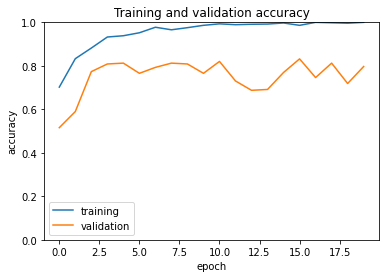

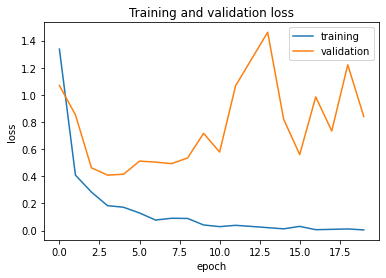

Found 320 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


{'cats': 0, 'big_cats': 1}
Overall Categorical Accuracy: 90.94%
Confusion Matrix
[[144  16]
 [ 13 147]]
AUC: 0.909


,Precision,Recall,F-Score,Support,Specificity
big_cats,0.901840,0.91875,0.910217,160.0,0.90000
cats,0.917197,0.90000,0.908517,160.0,0.90184


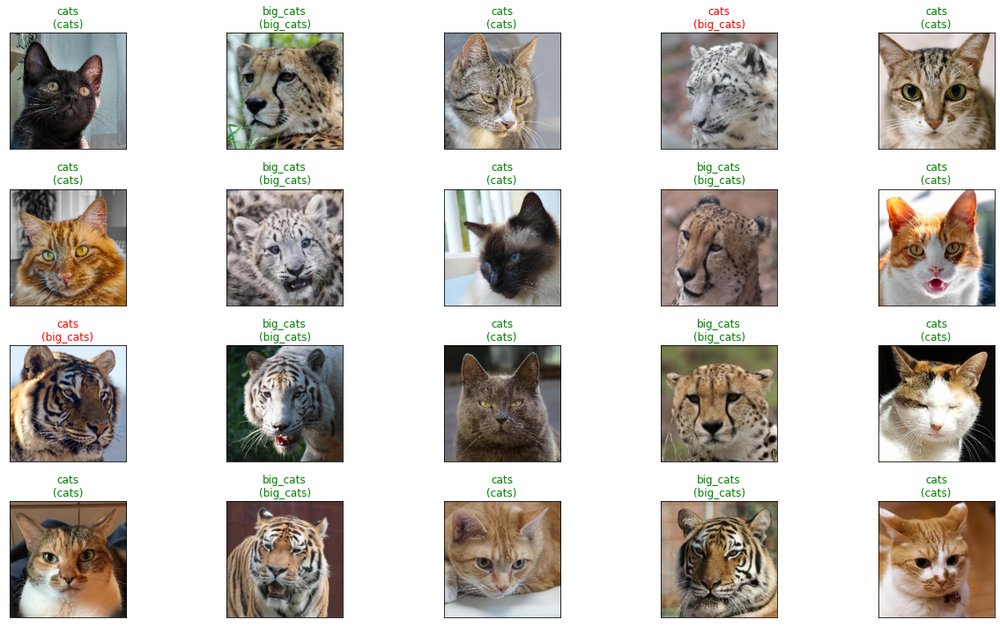

In [ ]:
batch_size = 32
height, width = (256,256)

train_dataset = imgdatagen.flow_from_directory(
    os.getcwd(),
    target_size = (height, width), 
    classes = ('cats','big_cats'),
    batch_size = batch_size,
    subset = 'training'
)

val_dataset = imgdatagen.flow_from_directory(
    os.getcwd(),
    target_size = (height, width), 
    classes = ('cats','big_cats'),
    batch_size = batch_size,
    subset = 'validation'
)

#Fully connected feed forward Neural Network
model = keras.models.Sequential()

model.add(keras.layers.Dense(50, input_shape=(height,width,3), activation='relu'))
model.add(keras.layers.Dense(24, activation='relu'))
model.add( keras.layers.Flatten() )
model.add( keras.layers.Dropout(0.9) )

model.add( keras.layers.Dense(
    2, activation='softmax',
    )
)

model.summary()

#Optimizer
model.compile(loss='binary_crossentropy',
              optimizer=keras.optimizers.Adadelta(lr = 1),
              metrics=['acc'])
#Model Training
# Saves Keras model after each epoch
from keras.callbacks import ModelCheckpoint
checkpointer = ModelCheckpoint(filepath='/content/animals_dataset/img_model_adadetla.weights.best.hdf5', 
                               verbose=1, 
                               save_best_only=True)
history = model.fit_generator(
    train_dataset, 
    validation_data = val_dataset,
    workers=10,
    epochs=20,
    callbacks= checkpointer
)

plot_history(history, (0, 1))

#Testing our model
test_generator = ImageDataGenerator(rescale=1/255.)

testgen = test_generator.flow_from_directory('/content/animals_dataset/test',
                                             target_size = (height, width), 
                                             batch_size = 1,
                                             class_mode= None,
                                             classes=classes, 
                                             shuffle=False,
                                             seed=42)
model.load_weights('/content/animals_dataset/img_model_adadetla.weights.best.hdf5')

predicted_classes = model.predict_classes(testgen)

class_indices = train_dataset.class_indices
print(class_indices)
class_indices = dict((v,k) for k,v in class_indices.items())
true_classes = testgen.classes

#Plot to visualize a sample of test dataset images        
plot_predictions(true_classes, predicted_classes, testgen, class_indices)

#Accuracy, Precision, Recall/sensitivity, F-score, Support, Specificity, Confusion Matrix, AUC
display_results(true_classes, predicted_classes, class_indices.values())


In [ ]:
optimizer_list.append('Adadelta')

In [ ]:
# Probability of test dataset belonging to {domestic , wild}

# wild is labeled as 1

# {'cats': 0, 'big_cats': 1}
import numpy as np
np.set_printoptions(suppress=True)
prob_domestic_wild = model.predict_proba(testgen, batch_size= batch_size, verbose=1)
print(prob_domestic_wild)

# Probability of each test dataset image falling into positive class

# wild is labeled as 1

# {'cats': 0, 'big_cats': 1}

# image path---------> prob(image belongs to wild dataset)

print("%-70s %-10s" % ("Image_Path", "Probability( Wild)"))
for i in range(len(testgen.filepaths)):
  print("%-70s %-10.4f" % (testgen.filepaths[i], prob_domestic_wild[i][1]))
  

 16/320 [>.............................] - ETA: 2s

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


320/320 [==============================] - 2s 6ms/step
[[0.9998461  0.00015387]
 [0.90386206 0.09613795]
 [0.96159095 0.03840902]
 [0.99997056 0.00002943]
 [0.9982843  0.00171566]
 [0.9998548  0.00014514]
 [0.9999765  0.0000235 ]
 [0.8958517  0.10414835]
 [0.9999405  0.00005949]
 [0.999793   0.00020705]
 [0.9999937  0.00000633]
 [0.9900275  0.00997251]
 [0.9998927  0.00010723]
 [0.9884658  0.01153425]
 [0.9991159  0.00088415]
 [0.9976609  0.00233908]
 [1.         0.        ]
 [0.90462065 0.09537935]
 [0.99862206 0.00137791]
 [0.9999999  0.00000011]
 [0.6709336  0.3290664 ]
 [0.9966288  0.00337117]
 [0.9999664  0.00003357]
 [0.00531918 0.9946808 ]
 [0.02324943 0.97675055]
 [0.9998136  0.00018643]
 [1.         0.00000003]
 [0.91091186 0.08908814]
 [0.99998903 0.00001095]
 [0.99988556 0.00011447]
 [0.9999962  0.00000381]
 [0.99998736 0.00001268]
 [0.99999917 0.00000083]
 [0.99891174 0.00108825]
 [0.13933164 0.8606683 ]
 [0.9873046  0.01269544]
 [0.99961865 0.00038128]
 [0.99998736 0.00001

Plotting accuracy of all optimizers

In [ ]:
print(optimizer_list)

['Adam', 'SGD(BS=256)', 'SGD(BS=16,m=0.9)', 'SGD(BS=16,m=0.5)', 'SGD(BS=1)', 'RMSprop', 'Adagrad', 'Adadelta']


In [ ]:
print(accuracy_list)

[0.8875, 0.8375, 0.609375, 0.840625, 0.5, 0.884375, 0.9, 0.909375]


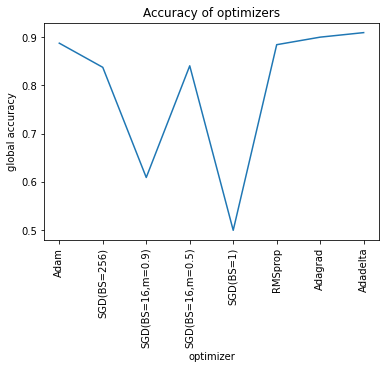

In [ ]:
plt.plot(optimizer_list, accuracy_list)
plt.xlabel('optimizer')
plt.ylabel('global accuracy')
plt.title('Accuracy of optimizers')
plt.xticks(rotation = 90)
plt.show()